- **Introduction to Computer Vision and Image Processing IBM**

# PIL

## Downloading the Images for the Lab

In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png

--2023-09-19 13:30:28--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K   428KB/s    in 1.1s    

2023-09-19 13:30:29 (428 KB/s) - ‘lenna.png’ saved [473831/473831]

--2023-09-19 13:30:29--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-course

## Creating a Helper Function to concatenate two images side-by-side

In [2]:
from PIL import Image

In [3]:
def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

## Image Files and Paths

In [4]:
my_image = 'lenna.png'

## Load Images

In [5]:
image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

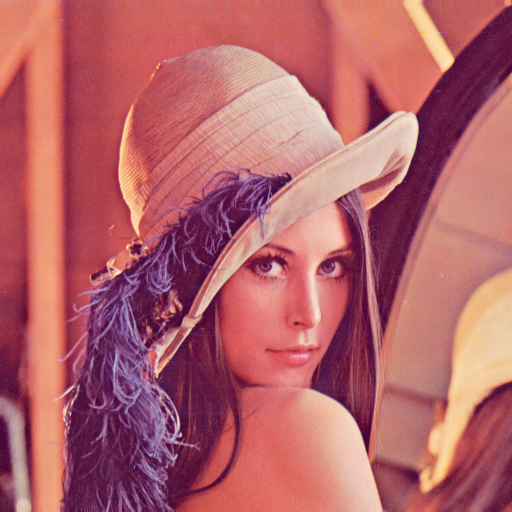

In [6]:
image

In [7]:
import matplotlib.pyplot as plt

In [8]:
# plt.figure(figsize=(10,10))
# plt.imshow(image)
# plt.show()

In [9]:
image.size

(512, 512)

In [10]:
image.mode

'RGB'

In [11]:
# Checking the intensity of the image at some column and row
im = image.load()
im[1, 0]

(226, 137, 125)

## Grayscale Images, Quantization and Color Channels

In [12]:
from PIL import ImageOps

In [13]:
image_gray = ImageOps.grayscale(image)
# image_gray

In [14]:
image_gray.mode

'L'

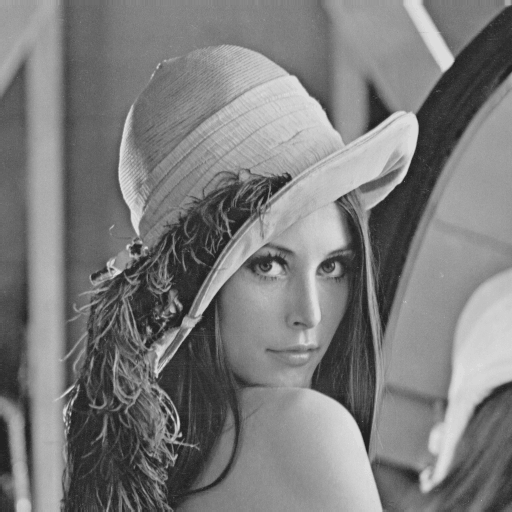

In [15]:
# Changing the intensity
image_gray.quantize(256 // 2)
# image_gray

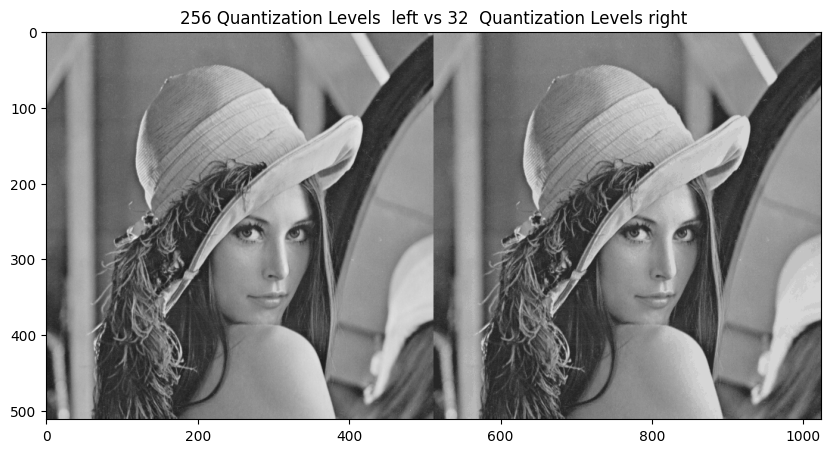

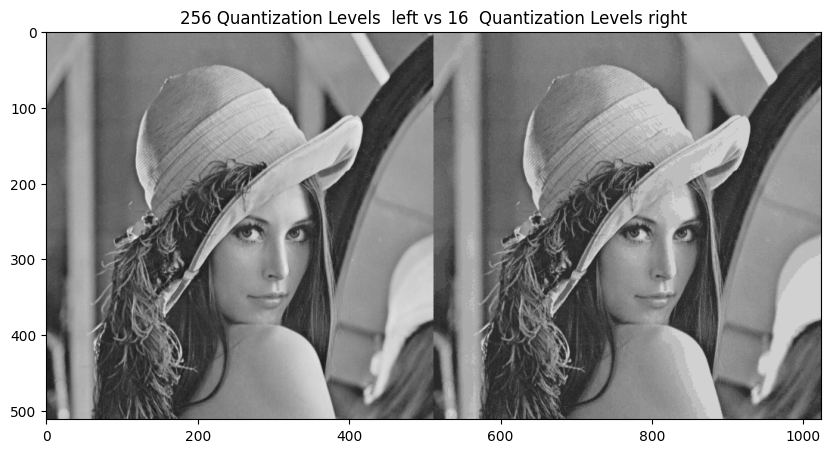

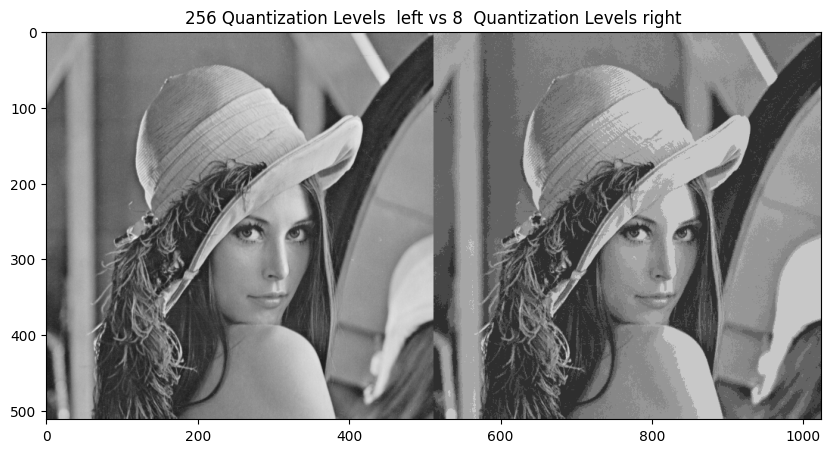

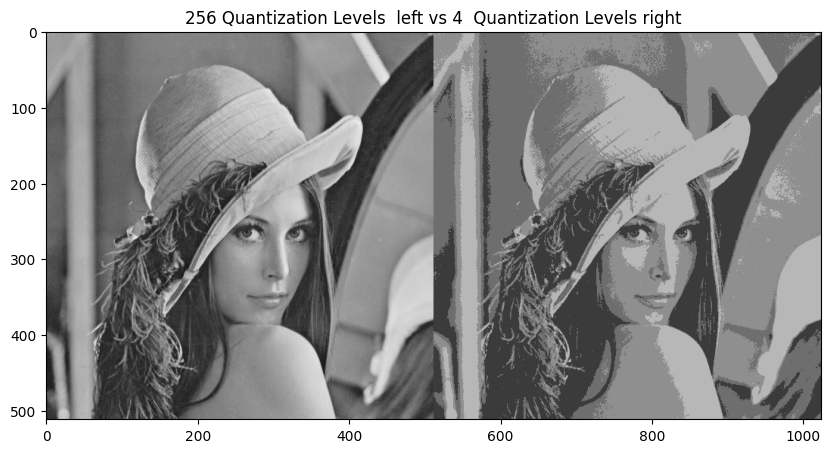

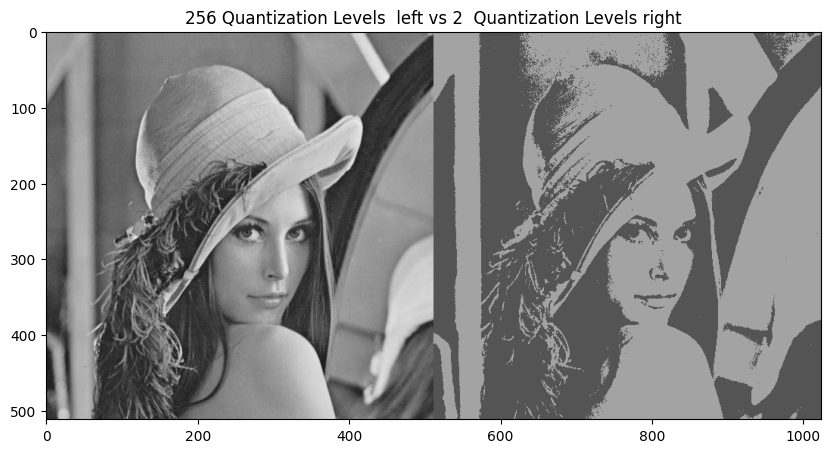

In [16]:
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n)))
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

In [17]:
baboon = Image.open('baboon.png')
# baboon

In [18]:
red, green, blue = baboon.split()

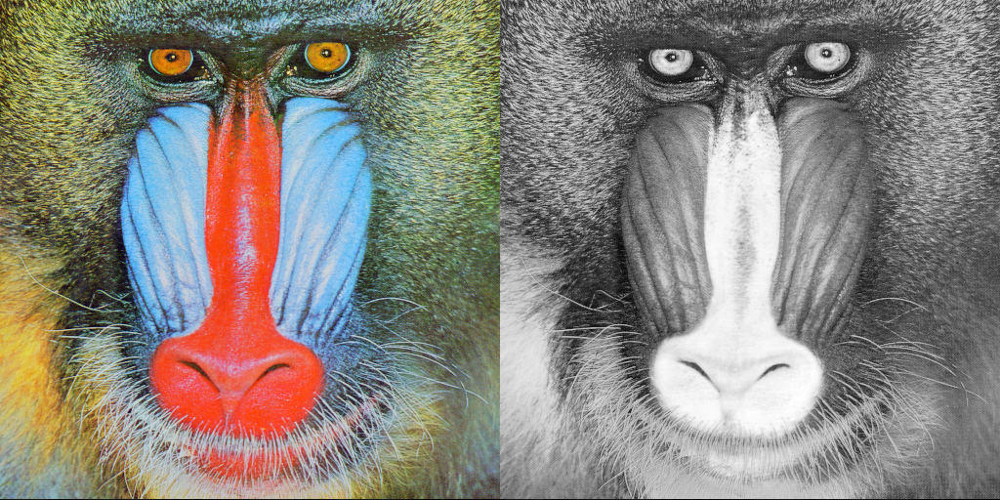

In [19]:
get_concat_h(baboon, red)

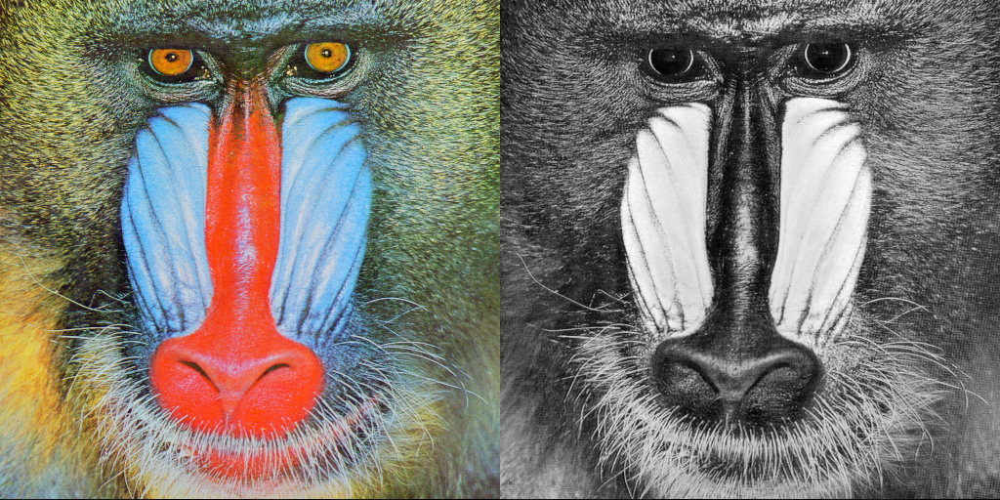

In [20]:
get_concat_h(baboon, blue)

In [21]:
# get_concat_h(baboon, green)

## PIL Images into NumPy Arrays

In [22]:
import numpy as np

In [23]:
# array = np.array(image)
# OR
array = np.asarray(image)
type(array)

numpy.ndarray

In [24]:
array.shape

(512, 512, 3)

In [25]:
array

array([[[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       ...,

       [[ 84,  18,  60],
        [ 84,  18,  60],
        [ 92,  27,  58],
        ...,
        [173,  73,  84],
        [172,  68,  76],
        [177,  62,  79]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]]

## Indexing

In [26]:
# plt.figure(figsize=(10,10))
# plt.imshow(array)
# plt.show()

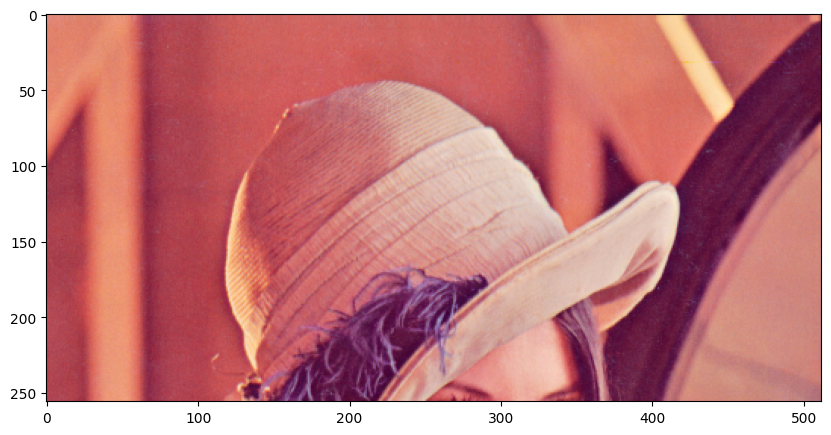

In [27]:
rows = 256
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,])
plt.show()

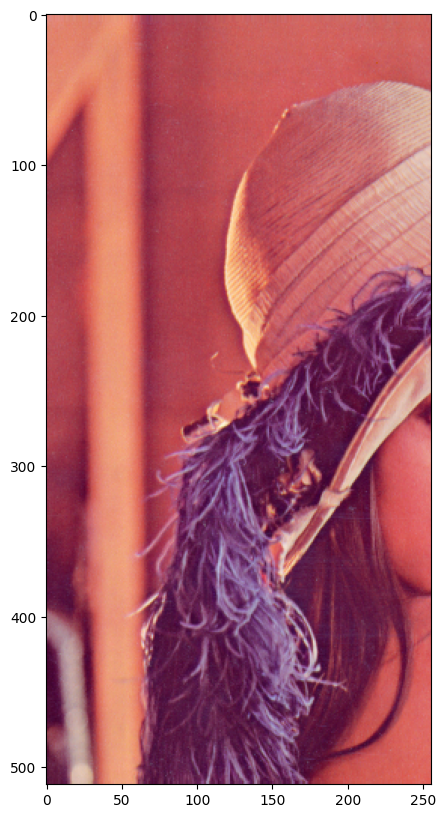

In [28]:
columns=256
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:columns,:])
plt.show()

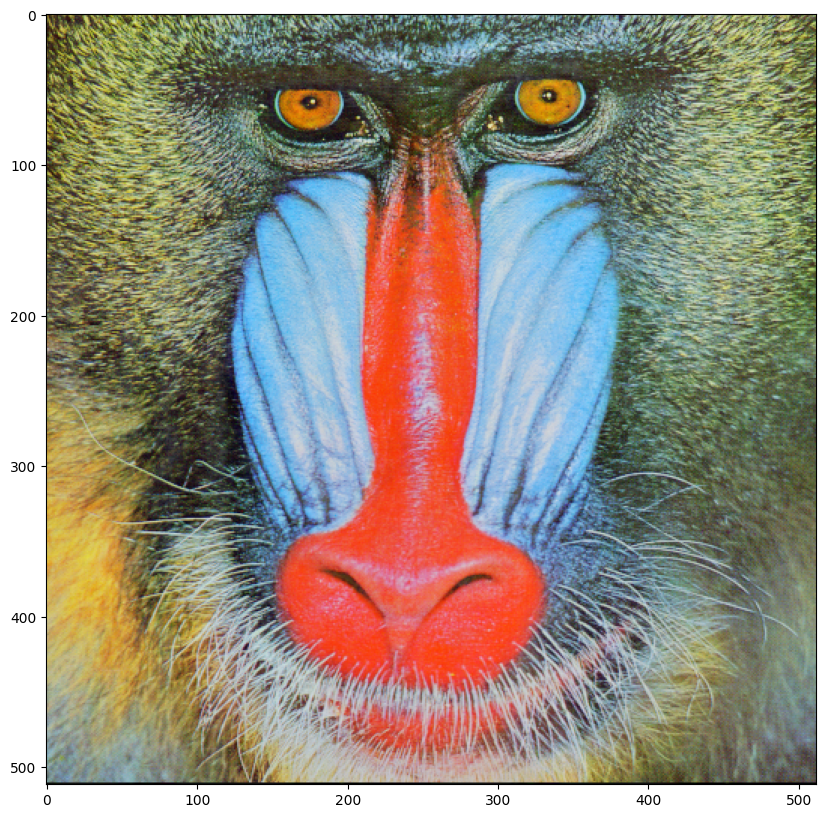

In [29]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

In [30]:
baboon_array = np.array(baboon)
# plt.figure(figsize=(10,10))
# plt.imshow(baboon_array[:,:,0], cmap='gray')
# plt.show()

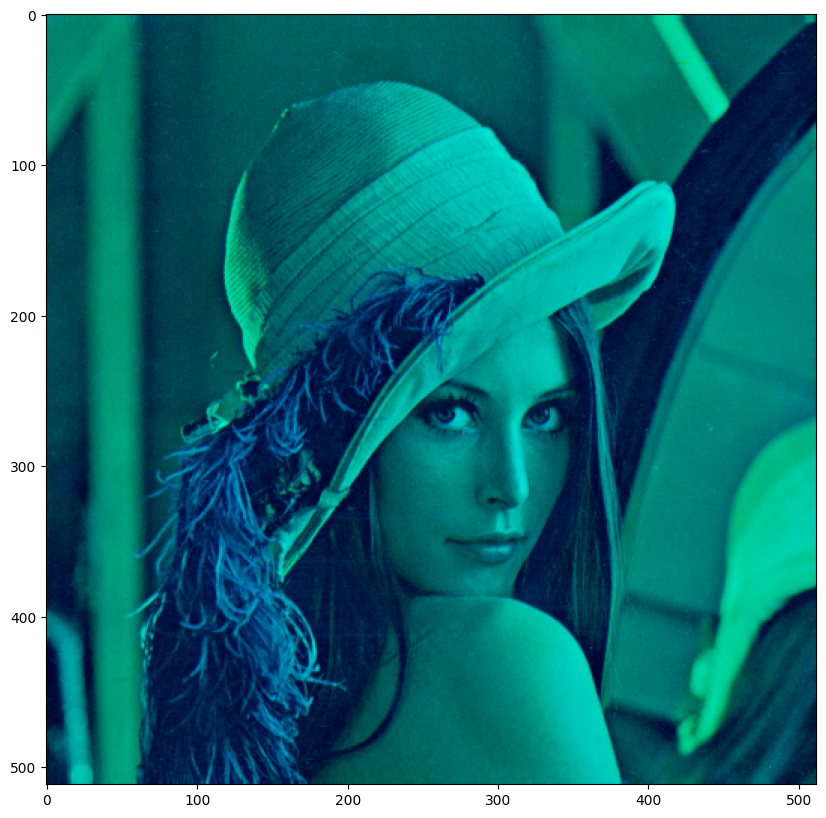

In [31]:
blue_lenna = Image.open('lenna.png')
blue_array = np.array(blue_lenna)
blue_array[:,:,0] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

In [32]:
red_lenna = Image.open('lenna.png')
red_lenna = np.array(red_lenna)
red_lenna[:,:,1] = 0
# plt.figure(figsize=(10,10))
# plt.imshow(red_lenna)
# plt.show()

## Manipulating Images

In [33]:
baboon = np.array(Image.open('baboon.png'))
# plt.figure(figsize=(5,5))
# plt.imshow(baboon )
# plt.show()

In [34]:
# Without the copy() method, the two variables will
# point to the same location in memory
A = baboon

In [35]:
id(A) == id(baboon)

True

In [36]:
B = baboon.copy()
id(B) == id(baboon)

False

In [37]:
baboon[:,:,] = 0

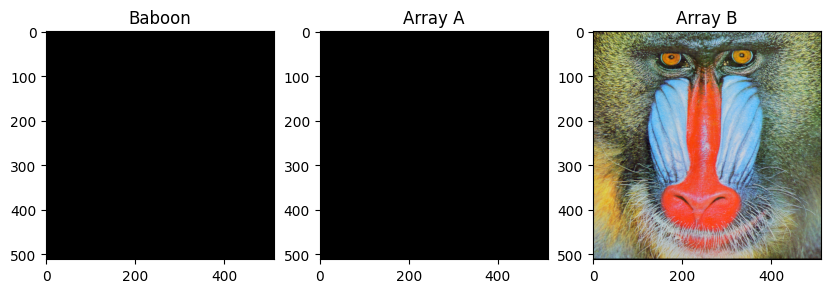

In [38]:
plt.figure(figsize=(10,10))
plt.subplot(131)
plt.imshow(baboon)
plt.title("Baboon")
plt.subplot(132)
plt.imshow(A)
plt.title("Array A")
plt.subplot(133)
plt.imshow(B)
plt.title("Array B")
plt.show()

## Flipping Images

In [39]:
image = Image.open('lenna.png')
# plt.figure(figsize=(10, 10))
# plt.imshow(image)
# plt.show()

In [40]:
array = np.array(image)
width, height, C = array.shape
print('Width, Height, C:', width, height, C)

Width, Height, C: 512 512 3


In [41]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)
for i, row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row

In [42]:
i, row

(511,
 array([[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]], dtype=uint8))

In [43]:
array_flip

array([[[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]],

       [[ 82,  22,  57],
        [ 82,  22,  57],
        [ 96,  32,  62],
        ...,
        [179,  70,  79],
        [181,  71,  81],
        [185,  74,  81]],

       [[ 84,  18,  60],
        [ 84,  18,  60],
        [ 92,  27,  58],
        ...,
        [173,  73,  84],
        [172,  68,  76],
        [177,  62,  79]],

       ...,

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]],

       [[226, 137, 125],
        [226, 137, 125],
        [223, 137, 133],
        ...,
        [230, 148, 122],
        [221, 130, 110],
        [200,  99,  90]]

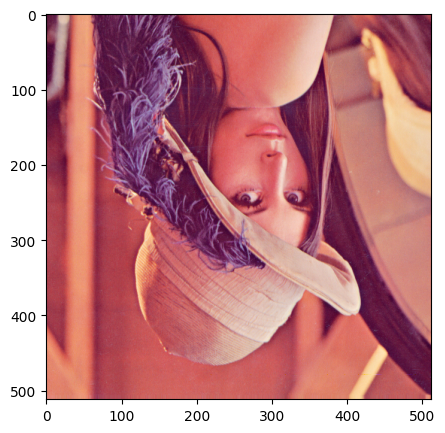

In [44]:
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

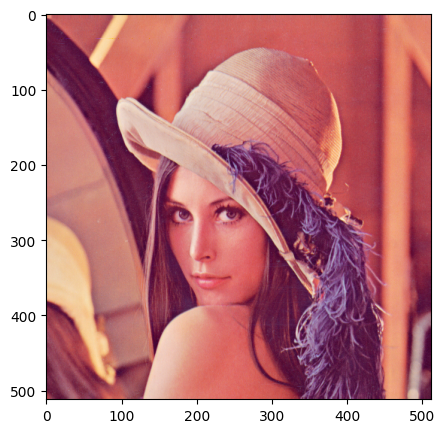

In [45]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

In [46]:
im_flip = image.transpose(1)
# plt.imshow(im_flip)
# plt.show()

In [47]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE,
        "TRANSVERSE": Image.TRANSVERSE}

In [48]:
flip["FLIP_LEFT_RIGHT"]

0

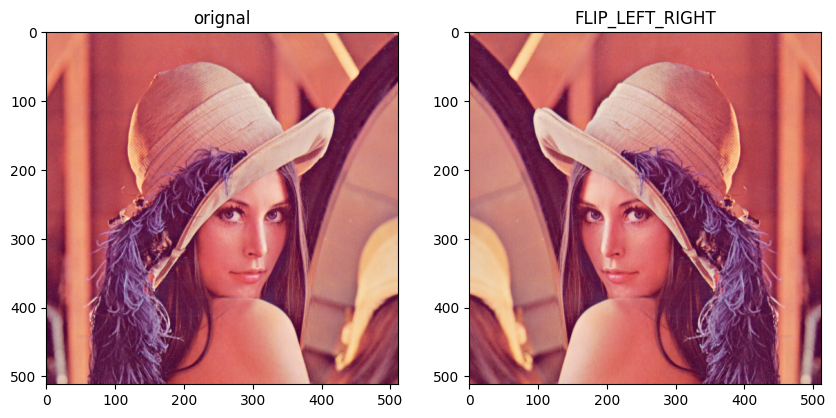

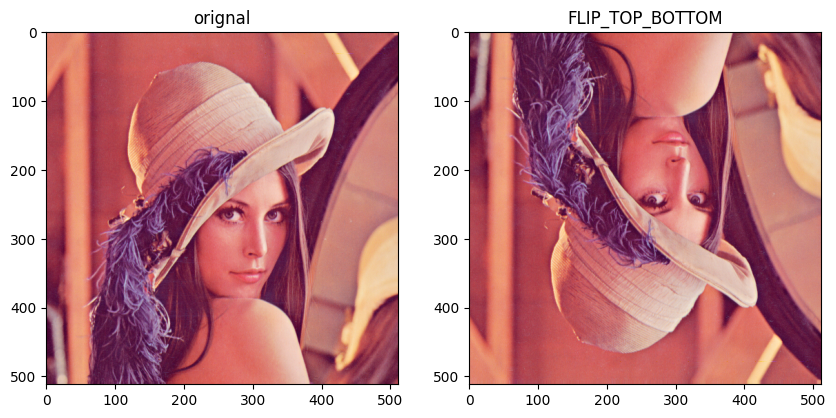

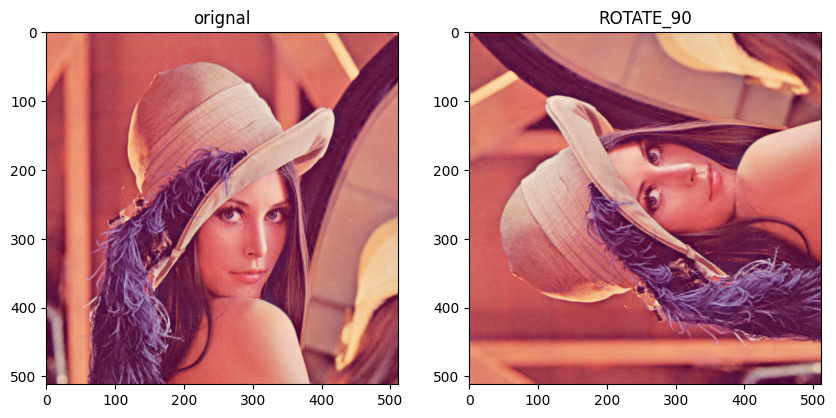

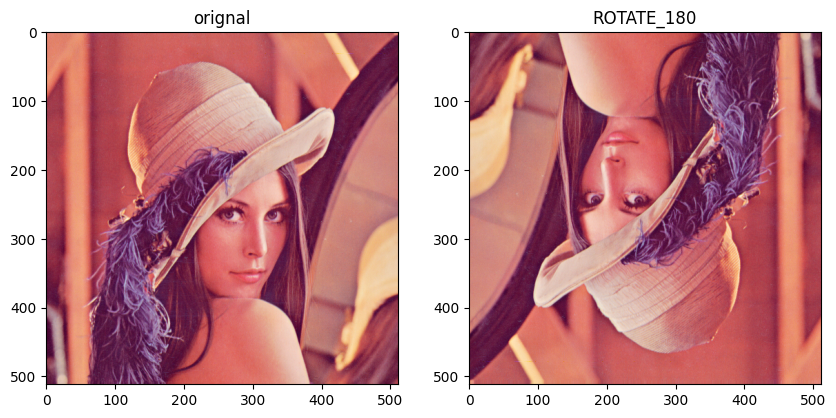

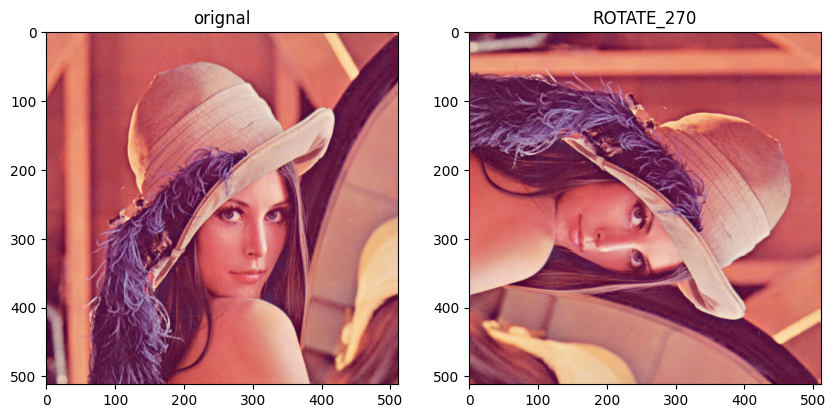

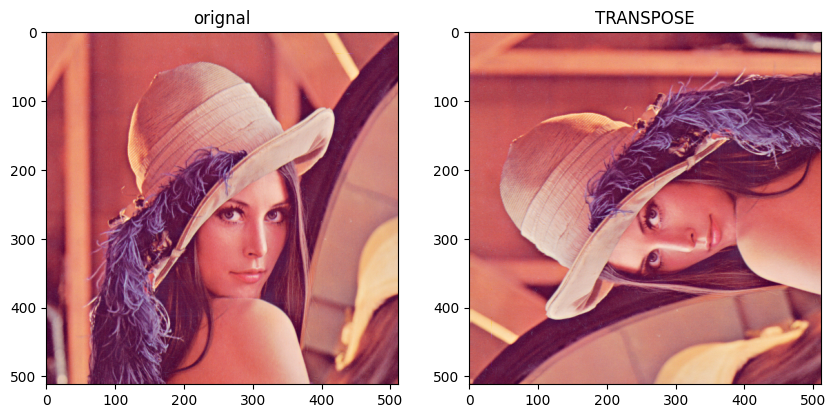

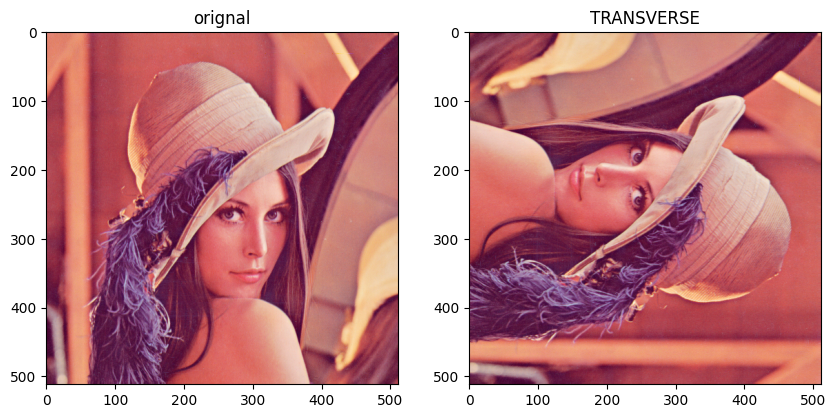

In [49]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

## Cropping an Image

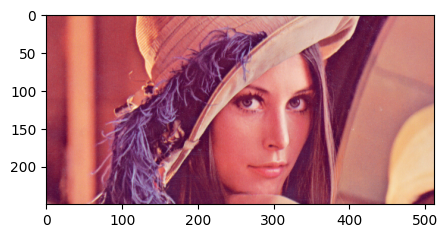

In [50]:
crop_top = array[150: 400,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

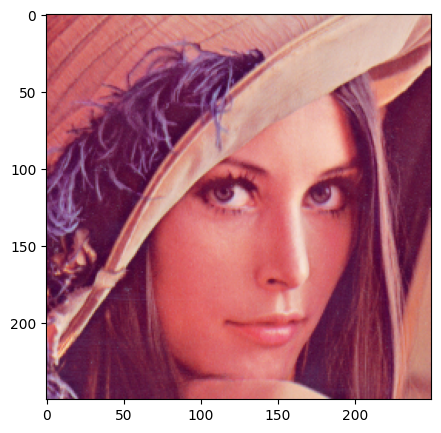

In [51]:
crop_horizontal = crop_top[: ,150:400,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

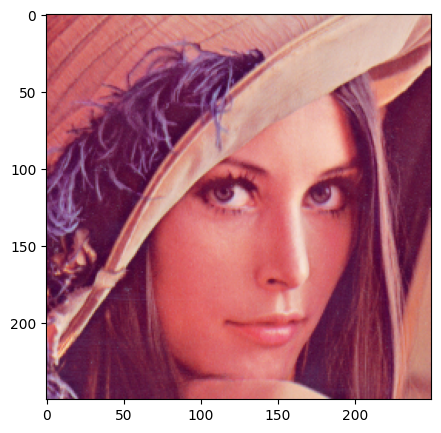

In [52]:
image = Image.open("lenna.png")
crop_image = image.crop((150, 150, 400, 400))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

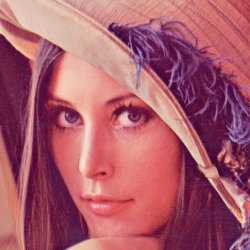

In [53]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

In [54]:
# Setting all the green and blue channels to zero
array_sq = np.copy(array)
array_sq[150:400, 150:400, 1:2] = 0

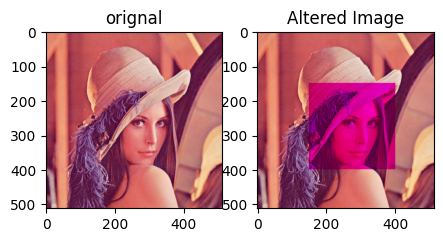

In [55]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

In [56]:
from PIL import ImageDraw

In [57]:
image_draw = image.copy()
image_fn = ImageDraw.Draw(im=image_draw)

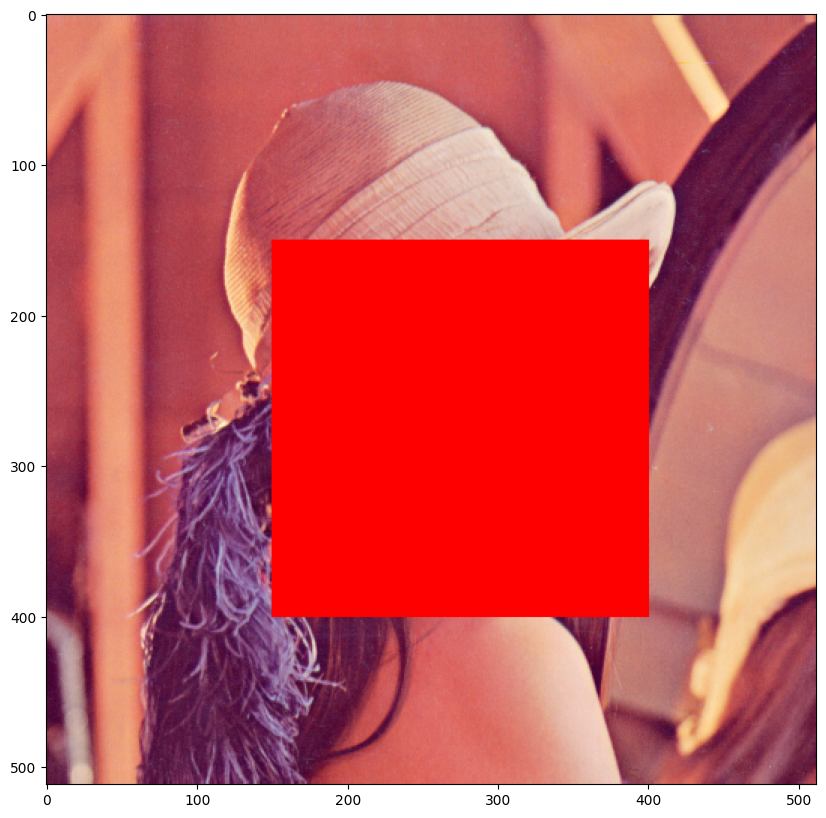

In [58]:
shape = [150, 150, 400, 400]
image_fn.rectangle(xy=shape,fill="red")
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

In [59]:
from PIL import ImageFont

In [60]:
### Annotate the box
image_fn.text(xy=(0,0), text='box', fill=(0,0,0))

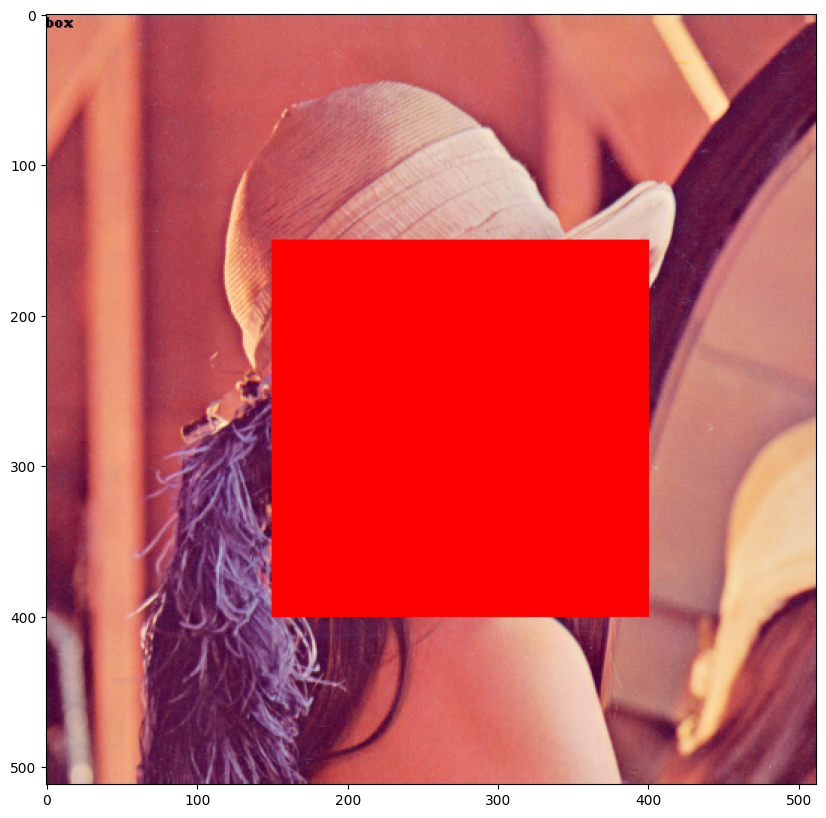

In [61]:
plt.figure(figsize=(10, 10))
plt.imshow(image_draw)
plt.show()

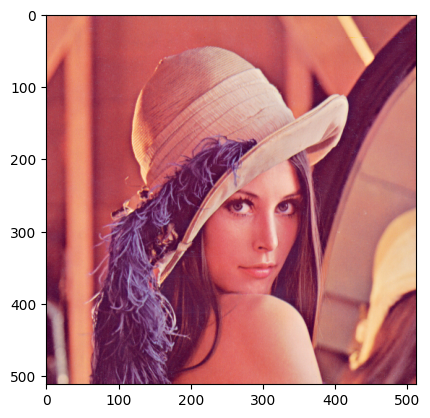

In [62]:
# Overlay one image over another
image_lenna = Image.open('lenna.png')
array_lenna = np.array(image_lenna)
array_lenna[150:400,150:400,:]=array[150:400,150:400,:]
plt.imshow(array_lenna)
plt.show()

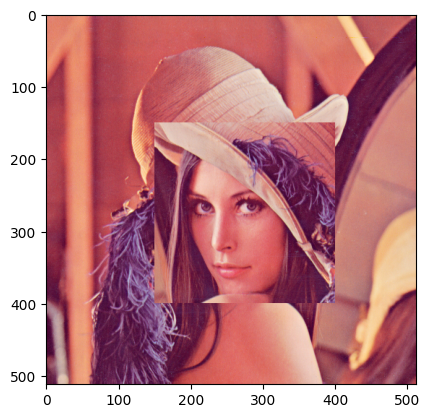

In [63]:
image_lenna.paste(crop_image, box=(150,150))
plt.imshow(image_lenna)
plt.show()